## Advanced Lane Finding Project

### Steps:

#### a) Pipeline for Lanes Image Processing:

**1.** Perform Camera Caliberation using the Chessboard Images and Save that model.

**2.** Apply Image Undistortion on Chessboard Images and check for Road Images as well.

**3.** Get Perspective Transform of Road Images i.e. "The Bird's Eye View of Lanes on Road"

**4.** Apply Color and Gradient Thresholding. ex. Sobel Thresholding, Sobel Magnitude, Sobel Gradient, Sobel Gradient Direction etc.

**5.** Define Image Processing Pipeline and process all Images of Road through that.

**6.** Use a Sliding Window Polyfit method to fit a line to the detected lane lines.

**7.** Get Radius of Curvature and Distance from Center of Lane.

**8.** Draw detected lanes and fill in between.

**9.** Plot the Images with their respective radius and distance from Center of the lane.

In [1]:
# Import Dependencies
import os
import cv2
import glob
import pickle
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread, imsave
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from IPython.html.widgets import *
%matplotlib inline

## Step-1: Camera Caliberation


#### 1. Find Chessboard Corners

##### Input: 

Grayscale Images

##### Output: 

ret = True/False, 

Corners = Array of corner values as (x,y)

#### 2. Draw Chessboard Corners

##### Input: 

Original Image

Number of Rows and Columns (row,col)

Corners and ret values from "1".


##### Output: 

Image with Corners Plotted on top

#### 3. Do Camera Caliberation

##### Input:

Object Points

Image Points

Shape of Grayscale Image

##### Output:

ret = True/False

mtx => Camera Matrix

dist => array of values

rvecs => Rotational Vector

tvecs => Translational Vector

Total Number of Images:  20
Corners found on Images:  17
Percentage of Caliberation Images used: 85.0 %


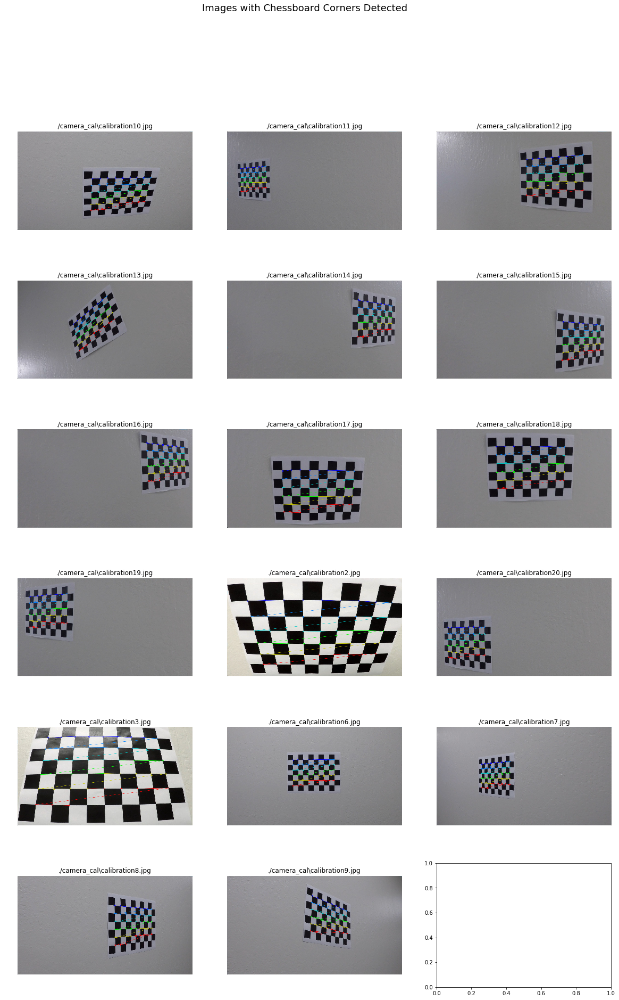

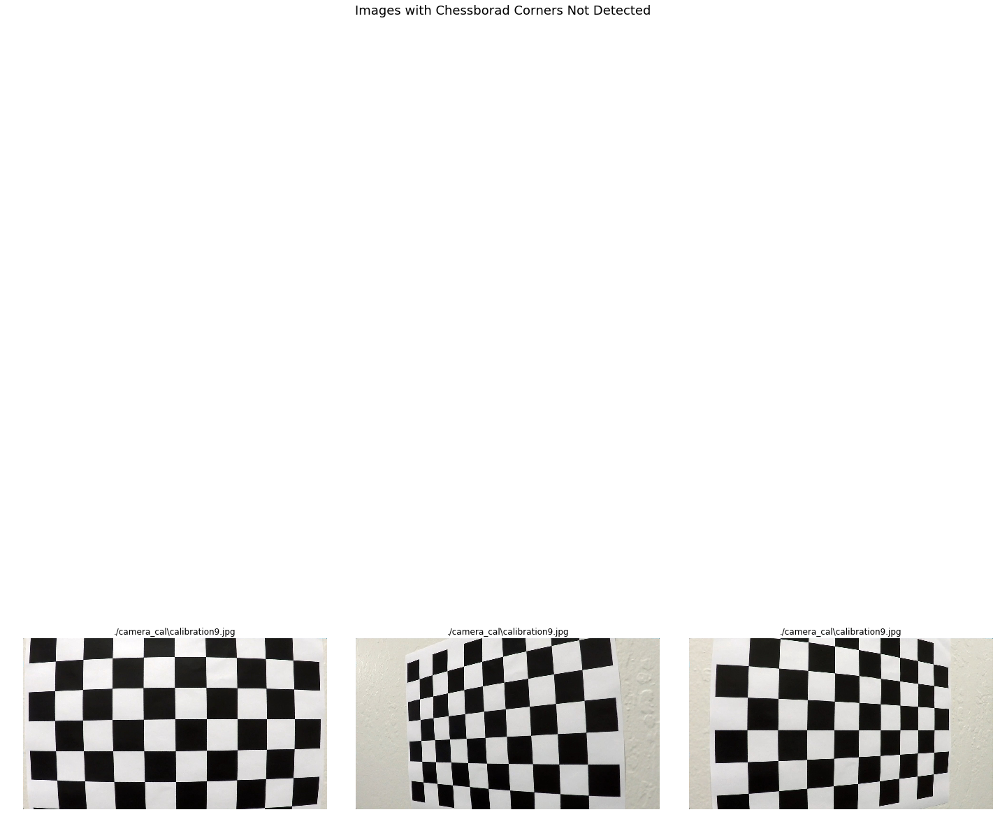

In [2]:
# Read All Chessboard Images and Find Corners

# Define corners in image
rows = 9
cols = 6

# # Map 2D Coordinates of Image to 3D coordinates on Chessboard
# 3-D Points in real world
# (x,y,0)
objPoints = []

# 2-D points in the image
# (x,y)
imgPoints = []

# Array to store names of images in which corners were not found
no_corners = []

# Create Object Points
# Since, cols = 8, rows = 6 in chessboard image
objp = np.zeros(shape=(rows * cols,3), dtype=np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Read in all Images
images = glob.glob('./camera_cal/calibration*.jpg')

# Figure Size for Plotting Images
fig, ax = plt.subplots(nrows=6, ncols=3, figsize=(20,30))
#plt.subplots_adjust(wspace=None, hspace=None)
#plt.tight_layout()
i = 0
j = 0

for image in images:   
    # Read the Image File
    img = imread(image)
    
    # Conver Image to Grayscale Image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Find Chessboard Corners
    ret, corners = cv2.findChessboardCorners(gray, (rows,cols), None)
    
    # If ret=True, append images and objectpoints
    if ret == True:
        imgPoints.append(corners)
        objPoints.append(objp)
        
        # Draw Corners on Chessboard Images
        img = cv2.drawChessboardCorners(img, (8,6), corners, ret)       
        
        # Plot Images with Chessboard Corners Detected
        ax[i,j].imshow(img)
        ax[i,j].set_axis_off()
        ax[i,j].set_title(image)
        #ax[i,j].set_aspect('equal')
        
        j += 1
        
        if j == 3:
            i += 1
            j = 0
    else:
        no_corners.append(image)

plt.suptitle('Images with Chessboard Corners Detected', fontsize=18)

        
# Plot Images in which the Corners were not Found
fig1, ax1 = plt.subplots(nrows=1, ncols=3, figsize=(20,30))
plt.suptitle('Images with Chessborad Corners Not Detected', fontsize=18)
plt.tight_layout()
k = 0
for img in no_corners:
    im = imread(img)
    ax1[k].imshow(im)
    ax1[k].set_axis_off()
    ax1[k].set_title(image)
    #ax1[k].set_aspect('equal')
    k += 1


# Print Overall Dataset Performance
print('Total Number of Images: ',len(images))
print ('Corners found on Images: ',len(imgPoints))
print('Percentage of Caliberation Images used: {} %'.format((len(imgPoints)/len(images)) * 100))

In [3]:
# Camera Caliberation

# Read in a Sample Image
img = imread('./camera_cal/calibration1.jpg')

img_size = (img.shape[1],img.shape[0])

# Caliberate Camera
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objPoints, imgPoints, img_size, None, None)

## Step-2: Image Undistortion

#### 1. Undistort Image:

##### Inputs:

img => Input Image

mtx => Camera Matrix

dist => Distortion Coefficients

##### Output:

dst => Matrix

In [4]:
# Function to Undistort Images
def undistort_image(image, cam_matrix, distort_coeff):
    dst = cv2.undistort(img, cam_matrix, distort_coeff, None, cam_matrix)
    return dst

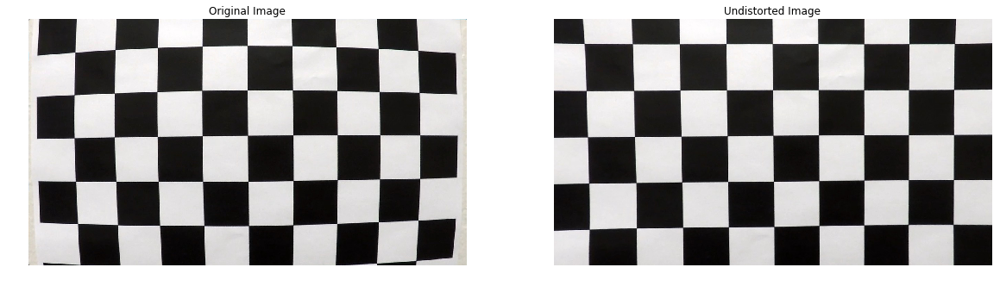

In [5]:
# Check Undistortion on Input Image
undistorted_img = undistort_image(img, mtx, dist)

# Plot Original and Undistorted Images
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,30))
ax[0].imshow(img)
ax[0].set_title('Original Image')
ax[0].set_axis_off()

ax[1].imshow(undistorted_img)
ax[1].set_title('Undistorted Image')
ax[1].set_axis_off()

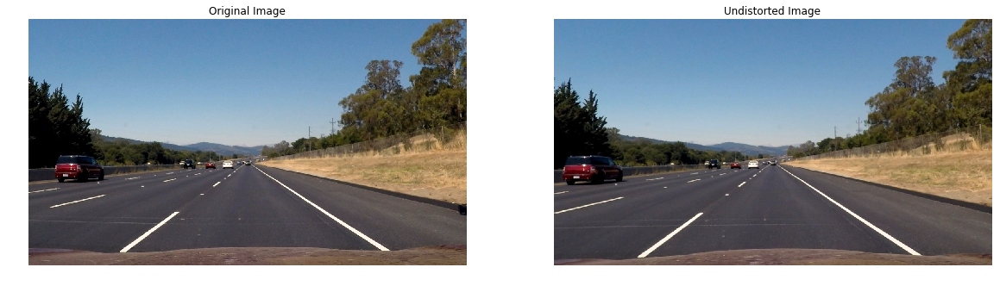

In [6]:
# Check Undistortion on Road Images
img = imread('./test_images/straight_lines2.jpg')

img_size = (img.shape[1],img.shape[0])

# Caliberate Camera
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objPoints, imgPoints, img_size, None, None)

# Check Undistortion on Input Image
undistorted_img = undistort_image(img, mtx, dist)

# Plot Original and Undistorted Images
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,30))
ax[0].imshow(img)
ax[0].set_title('Original Image')
ax[0].set_axis_off()

ax[1].imshow(undistorted_img)
ax[1].set_title('Undistorted Image')
ax[1].set_axis_off()

## Step-3: Unwarp Image [Bird's Eye View]

In [7]:
# Function to Unwarp Image
def unwarp_image(img, src, dst):
    # Get Image Height and Width
    height = img.shape[0]
    width = img.shape[1]
    
    # Get Perspective Transform Matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Get inverse Perspective Tranform Matrix
    Minv = cv2.getPerspectiveTransform(dst,src)
    
    # Warp the Images to get a Bird's Eye View of the Lane
    warped_image = cv2.warpPerspective(img, M, (width, height), flags = cv2.INTER_LINEAR)
    return warped_image, M, Minv

In [8]:
# Get Height and Width of Undistorted Image
height = undistorted_img.shape[0]
width = undistorted_img.shape[1]

# Define Source and Destination points for Transform

# Original Values
src = np.float32([(575,464),
                  (707,464), 
                  (258,682), 
                  (1049,682)])

dst = np.float32([(450,0),
                  (width - 450,0),
                  (450, height),
                  (width - 450, height)])

# src = np.float32([(575,460),
#                   (750,460), 
#                   (250,682), 
#                   (1130,682)])

# dst = np.float32([(450,0),
#                   (width - 450,0),
#                   (450, height),
#                   (width - 450, height)])

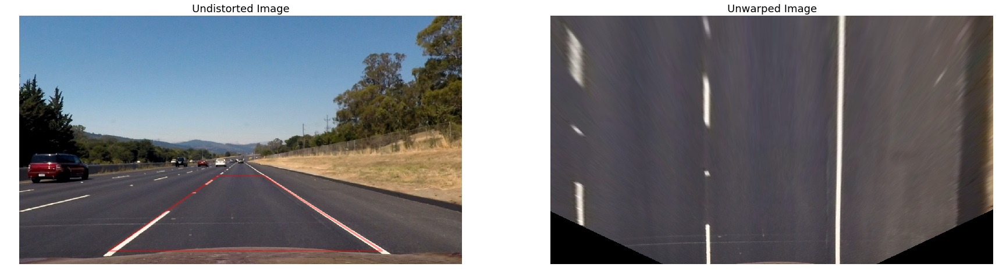

In [9]:
# Get the Unwarped Image and Plot it
unwarped_img, M, Minv = unwarp_image(undistorted_img, src, dst)

# Apply Gaussian Blur to Warped Image
# TEST
gray = cv2.cvtColor(unwarped_img, cv2.COLOR_RGB2GRAY)
#kernel_size = 5
#gauss = cv2.GaussianBlur(gray,(kernel_size,kernel_size),0)

# Array of Points depicting the Quadrilateral for Lane Lines
x_cord = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y_cord = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]

# Plot Unwarped Image with Original Image
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(30,20))
ax1.imshow(undistorted_img)
ax1.plot(x_cord, y_cord, color='r', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax1.set_ylim([height,0])
ax1.set_xlim([0,width])
ax1.set_axis_off()
ax1.set_title('Undistorted Image', fontsize=18)

ax2.imshow(unwarped_img, cmap='gray')
ax2.set_axis_off()
ax2.set_title('Unwarped Image',fontsize=18)

## Step-4: Apply Color and Gradient Threshold

### 1. Check Colorspace that provides the Best Representation of Lane Lines

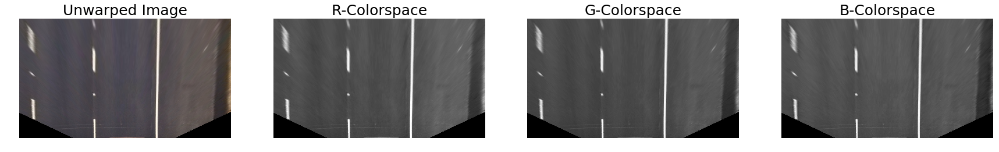

In [10]:
# RGB Colorspace
def img2rgb(img):
    R = img[:,:,0]
    G = img[:,:,1]
    B = img[:,:,2]
    return R,G,B

r, g, b = img2rgb(unwarped_img)

fig, (ax1,ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(30,20))
ax1.imshow(unwarped_img)
ax1.set_axis_off()
ax1.set_title('Unwarped Image', fontsize=25)

# H-colorspace
ax2.imshow(r, cmap='gray')
ax2.set_axis_off()
ax2.set_title('R-Colorspace', fontsize=25)

# S-colorspace
ax3.imshow(g, cmap='gray')
ax3.set_axis_off()
ax3.set_title('G-Colorspace', fontsize=25)

# V-colorspace
ax4.imshow(b, cmap='gray')
ax4.set_axis_off()
ax4.set_title('B-Colorspace', fontsize=25)

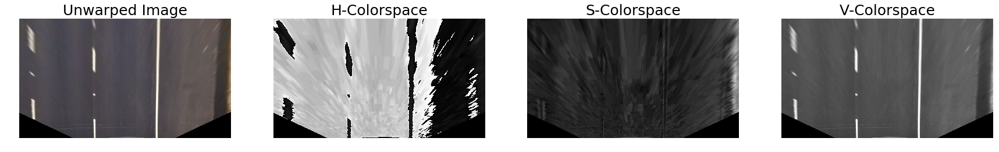

In [11]:
# RGB to HSV Colorspace
def rgb2hsv(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    H = hsv[:,:,0]
    S = hsv[:,:,1]
    V = hsv[:,:,2]
    return H, S, V

h, s, v = rgb2hsv(unwarped_img)


fig, (ax1,ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(30,20))
ax1.imshow(unwarped_img)
ax1.set_axis_off()
ax1.set_title('Unwarped Image', fontsize=25)

# H-colorspace
ax2.imshow(h, cmap='gray')
ax2.set_axis_off()
ax2.set_title('H-Colorspace', fontsize=25)

# S-colorspace
ax3.imshow(s, cmap='gray')
ax3.set_axis_off()
ax3.set_title('S-Colorspace', fontsize=25)

# V-colorspace
ax4.imshow(v, cmap='gray')
ax4.set_axis_off()
ax4.set_title('V-Colorspace', fontsize=25)

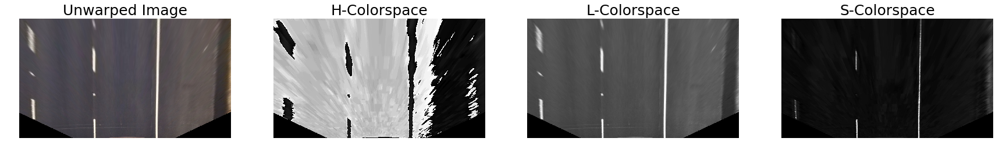

In [12]:
# RGB to HLS Colorspace
def rgb2hls(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    return H, L, S

h, l, s = rgb2hls(unwarped_img)


fig, (ax1,ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(30,20))
ax1.imshow(unwarped_img)
ax1.set_axis_off()
ax1.set_title('Unwarped Image', fontsize=25)

# H-colorspace
ax2.imshow(h, cmap='gray')
ax2.set_axis_off()
ax2.set_title('H-Colorspace', fontsize=25)

# S-colorspace
ax3.imshow(l, cmap='gray')
ax3.set_axis_off()
ax3.set_title('L-Colorspace', fontsize=25)

# V-colorspace
ax4.imshow(s, cmap='gray')
ax4.set_axis_off()
ax4.set_title('S-Colorspace', fontsize=25)

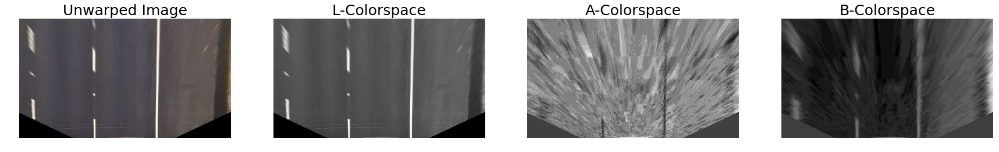

In [13]:
# RGB to LAB Colorspace
def rgb2lab(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    L = lab[:,:,0]
    A = lab[:,:,1]
    B = lab[:,:,2]
    return L, A, B

l, a, b = rgb2lab(unwarped_img)


fig, (ax1,ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(30,20))
ax1.imshow(unwarped_img)
ax1.set_axis_off()
ax1.set_title('Unwarped Image', fontsize=25)

# H-colorspace
ax2.imshow(l, cmap='gray')
ax2.set_axis_off()
ax2.set_title('L-Colorspace', fontsize=25)

# S-colorspace
ax3.imshow(a, cmap='gray')
ax3.set_axis_off()
ax3.set_title('A-Colorspace', fontsize=25)

# V-colorspace
ax4.imshow(b, cmap='gray')
ax4.set_axis_off()
ax4.set_title('B-Colorspace', fontsize=25)

### 2. Check the Gradient Thresholding Methods

In [14]:
# Sobel Grdient x & y
# Sobel Gradient Magnitude
# Sobel Gradient Direction

# Sobel "x" Gradient
# Tried Ksize = 5, 11. Didnt improve output
def sobelGradientImage(img, orient= 'x', thresh_Sobel = (30,100)):
    gray = (cv2.cvtColor(img, cv2.COLOR_RGB2Lab))
    gray = gray[:,:,0]
    
    if orient== 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
        #sobel_abs = np.absolute(sobel_x)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    sobel_abs = np.absolute(sobel)
    
    scaled_sobel = np.uint8(255*sobel_abs/np.max(sobel_abs))
    
    # Sobel Threshold
    sob_threshold = np.zeros_like(scaled_sobel)
    sob_threshold[(scaled_sobel >= thresh_Sobel[0]) & (scaled_sobel <= thresh_Sobel[1])] = 1
    
    return sob_threshold

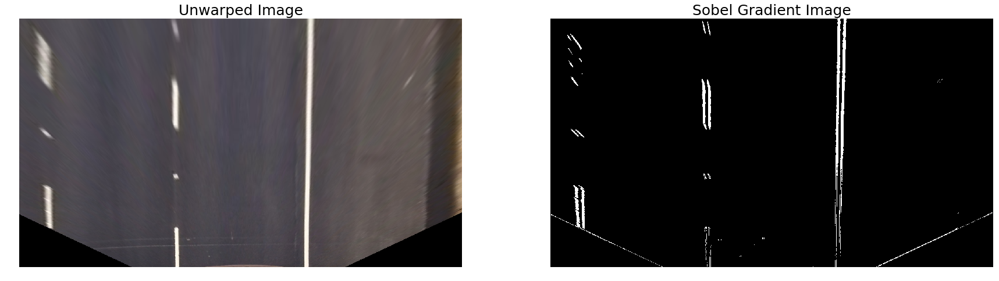

In [15]:
# Test Sobel Gradient Output
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(30,20))
ax1.imshow(unwarped_img)
ax1.set_title('Unwarped Image', fontsize=25)
ax1.set_axis_off()

ax2.imshow(sobelGradientImage(unwarped_img), cmap='gray')
ax2.set_title('Sobel Gradient Image', fontsize=25)
ax2.set_axis_off()

In [22]:
# Function to Calculate Magnitude of the Gradients
def sobelMagThresh(image, sobel_kernel=1, mag_thresh=(25, 255)):
    # Calculate gradient magnitude
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Calculate the magnitude
    sobel_mag = np.sqrt((sobel_x * sobel_x) + (sobel_y * sobel_y))
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    #scaled_sobel = np.uint8(255*sobel_mag/np.max(sobel_mag))
    
    # 5) Create a binary mask where mag thresholds are met
    sob_mag = np.zeros_like(sobel_mag)
    sob_mag[(sobel_mag >= mag_thresh[0]) & (sobel_mag <= mag_thresh[1])] = 1
    # Apply threshold
    return sob_mag

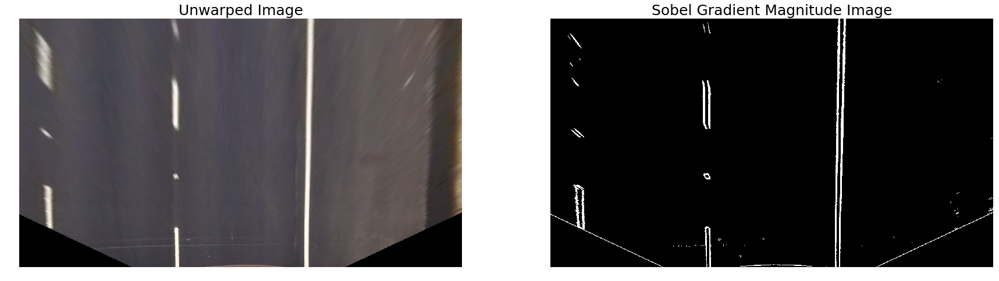

In [23]:
# Test Sobel Gradient Magnitude Output
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(30,20))
ax1.imshow(unwarped_img)
ax1.set_title('Unwarped Image', fontsize=25)
ax1.set_axis_off()

ax2.imshow(sobelMagThresh(unwarped_img), cmap='gray')
ax2.set_title('Sobel Gradient Magnitude Image', fontsize=25)
ax2.set_axis_off()

In [24]:
# Function to get Gradient Direction
def sobelDirThreshold(image, sobel_kernel=7, thresh=(0, 0.10)):
    # Calculate gradient direction
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the x and y gradients
    sobelx_abs = np.absolute(sobel_x)
    sobely_abs = np.absolute(sobel_y)
    
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction_of_gradient = np.arctan2(sobely_abs,sobelx_abs)
    
    # Create a binary mask where direction thresholds are met
    sob_dir = np.zeros_like(direction_of_gradient)
    sob_dir[(direction_of_gradient >= thresh[0]) & (direction_of_gradient <= thresh[1])] = 1
    
    return sob_dir

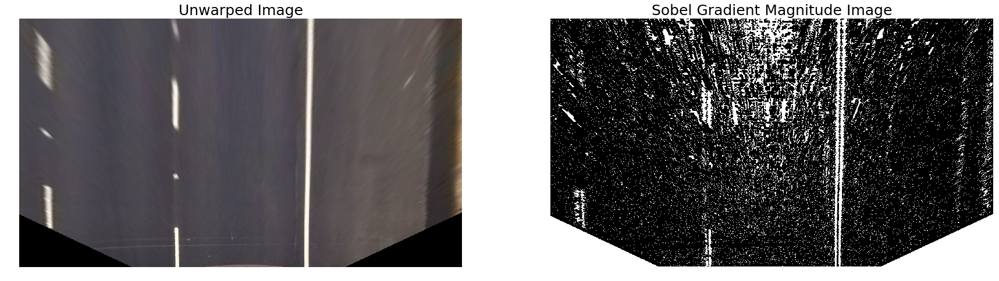

In [25]:
# Test Sobel Direction Gradient Output
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(30,20))
ax1.imshow(unwarped_img)
ax1.set_title('Unwarped Image', fontsize=25)
ax1.set_axis_off()

ax2.imshow(sobelDirThreshold(unwarped_img), cmap='gray')
ax2.set_title('Sobel Gradient Magnitude Image', fontsize=25)
ax2.set_axis_off()

...


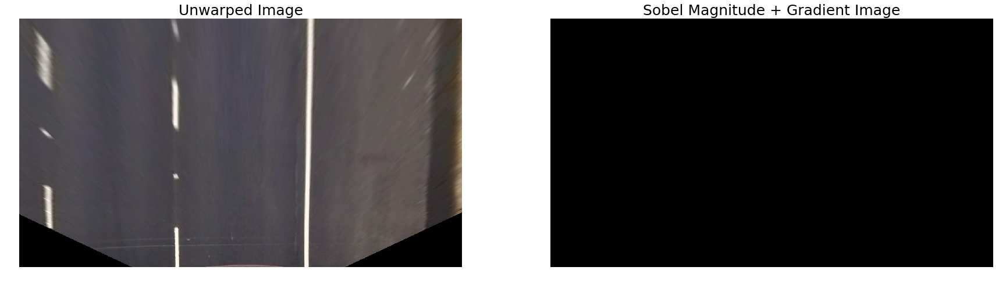

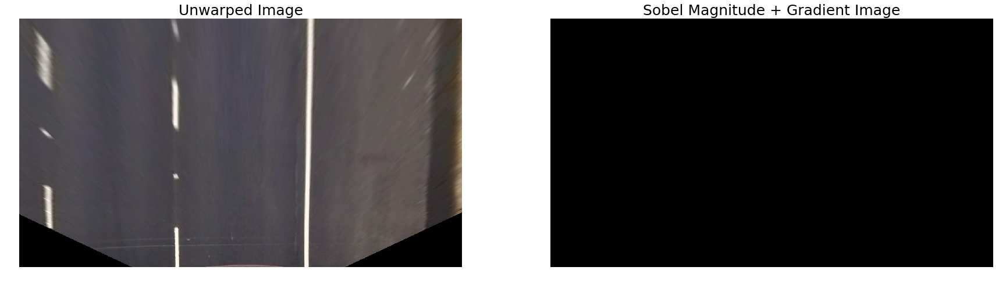

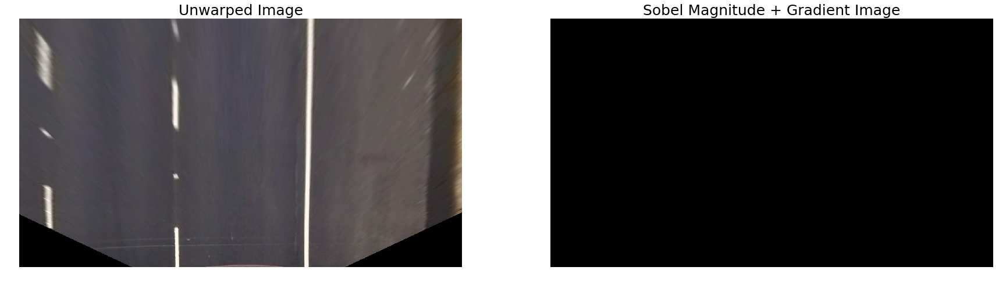

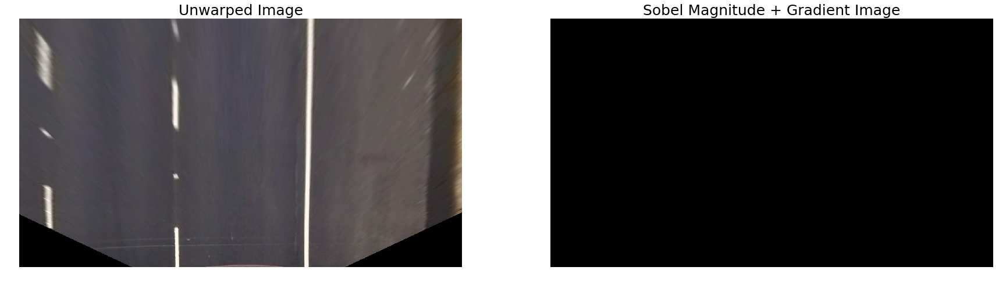

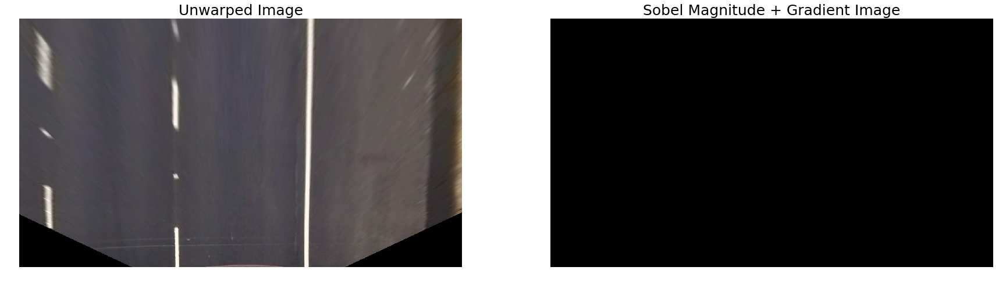

...

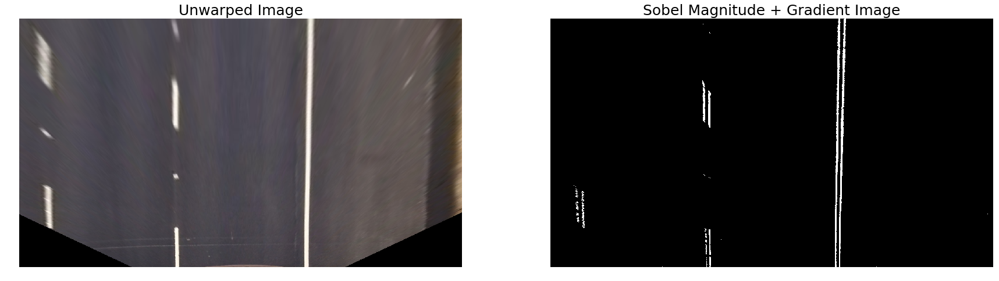

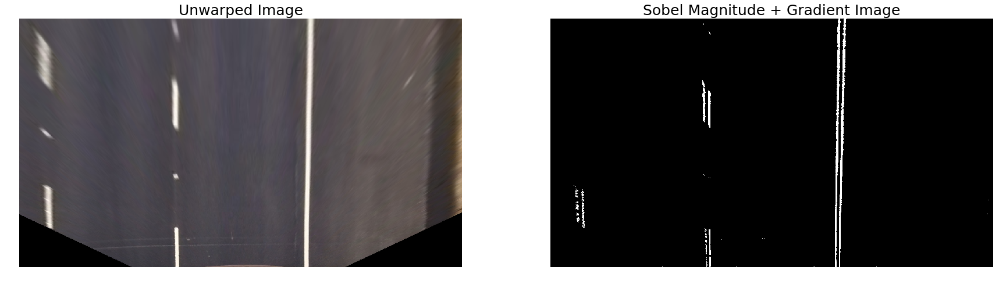

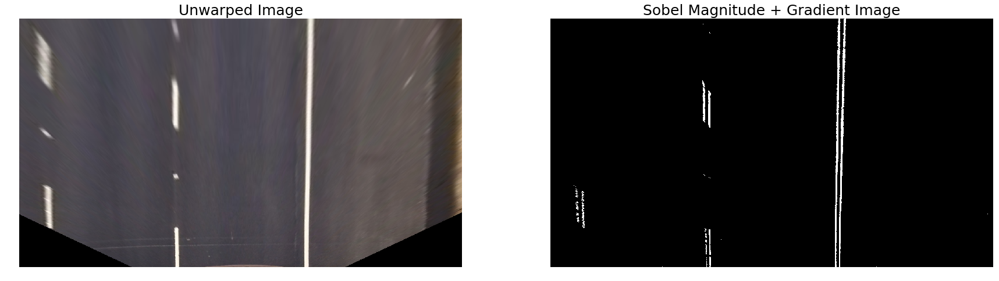

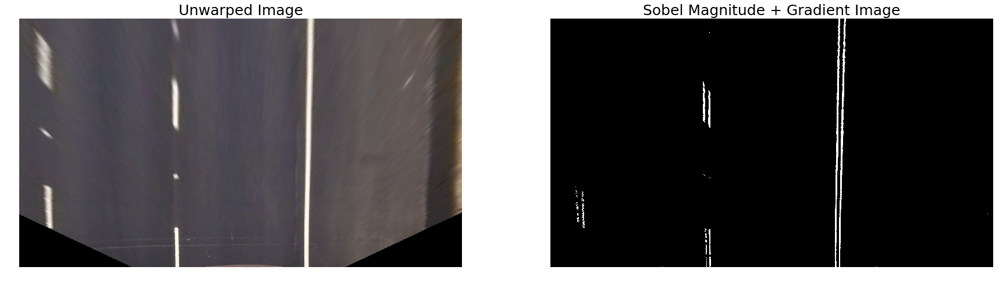

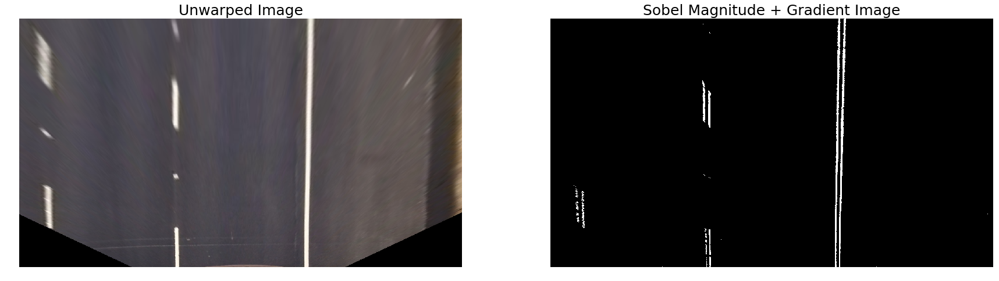

In [21]:
# Combining Sobel Magnitude and Direction Gradient
def combinedThresholds(sobelMag_kernel,sobelMag_MinThresh,sobelMag_MaxThresh,sobelDir_kernel,sobelDir_MinThresh,sobelDir_MaxThresh):
    sob_mag = sobelMagThresh(unwarped_img, sobel_kernel=sobelMag_kernel, mag_thresh=(sobelMag_MinThresh, sobelMag_MaxThresh))
    sob_dir = sobelDirThreshold(unwarped_img, sobel_kernel=sobelDir_kernel, thresh=(sobelDir_MinThresh, sobelDir_MaxThresh))
    # Combine the two Thresholds
    combined_binary = np.zeros_like(sob_mag)
    combined_binary[(sob_mag == 1) & (sob_dir == 1)] = 1
    
    # Plot Combining Sobel Magnitude and Direction Gradient
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(30,20))
    ax1.imshow(unwarp)
    ax1.set_title('Unwarped Image', fontsize=25)
    ax1.set_axis_off()

    ax2.imshow(combined_binary, cmap='gray')
    ax2.set_title('Sobel Magnitude + Gradient Image', fontsize=25)
    ax2.set_axis_off()

interact(combinedThresholds, sobelMag_kernel=(1,32,2),
        sobelMag_MinThresh=(0,255), 
        sobelMag_MaxThresh=(0,255),
        sobelDir_kernel=(1,31,2), 
        sobelDir_MinThresh=(0,np.pi/2,0.01), 
        sobelDir_MaxThresh=(0,np.pi/2,0.01))

print('...')
    #return combined_binary

In [26]:
# # Combining Sobel Magnitude and Direction Gradient
def combinedThresholds(img):
    sob_mag = sobelMagThresh(img)
    sob_dir = sobelDirThreshold(img)
    # Combine the two Thresholds
    combined_binary = np.zeros_like(sob_mag)
    combined_binary[(sob_mag == 1) & (sob_dir == 1)] = 1
    return combined_binary

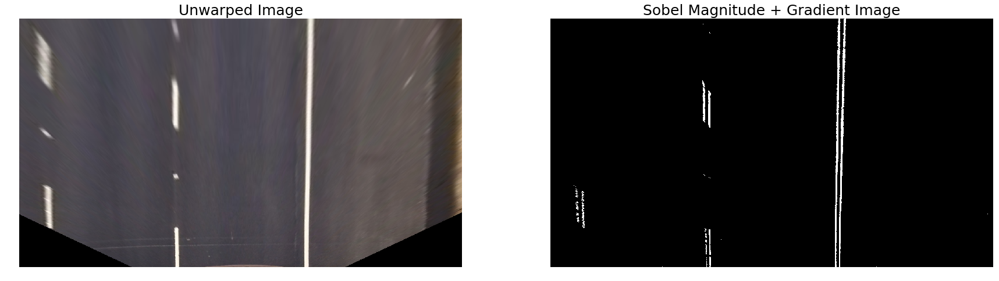

In [27]:
# Plot Combining Sobel Magnitude and Direction Gradient
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(30,20))
ax1.imshow(unwarped_img)
ax1.set_title('Unwarped Image', fontsize=25)
ax1.set_axis_off()

ax2.imshow(combinedThresholds(unwarped_img), cmap='gray')
ax2.set_title('Sobel Magnitude + Gradient Image', fontsize=25)
ax2.set_axis_off()